## Вступление

В этом проекте я реализовывал построение различных визуализаций , а также проведение **разведочного анализа данных** (exploratory data analysis, EDA), чтобы исследовать поведение данных и выявить в них закономерности. Мы поработаем с данными о пассажирах Титаника.

### Цели:
* реализация графиков  с библиотеками matplotlib, seaborn и визуализациями в pandas
* делать однофакторный анализ
* исследовать поведение данных и выявить в них закономерности

## О данных

Будем работать с [датасетом физической активности](https://www.kaggle.com/datasets/uciml/human-activity-recognition-with-smartphones). 

В этом датасете собраны данные 30 человек, выполняющих различные действия со смартфоном на поясе. Данные записывались с помощью датчиков (акселерометра и гироскопа) в этом смартфоне. Были зафиксированы: "3-осевое линейное ускорение" (_tAcc-XYZ_) и "3-осевая угловая скорость" (_tGyro-XYZ_).

1. Все сигналы отсортированы по времени, пропущены через фильтр шума.
2. Все наблюдения были разделены на окна по 128 сигналов в каждом, причем окна пересекаются на 50% (грубо говоря, с 1 по 128 сигнал в 1 окно, с 64 до 192 сигнала - во 2 окно и так далее).
3. Линейное ускорение было разделено на две составляющие (с помощью низкочастотного фильтра): ускорение самого тела, а также гравитационная составляющая. Будем называть их ускорением тела и гравитационным ускорением.
4. К получившимся окнам применяли различные функции для получения следующих показателей:
    - max
    - min
    - mad (median)
    - mean
    - std
    - skewness (коэффициент асимметричности распределения признака в окне)
    - etc. (подробнее, на сколько это возможно, указано на [страничке датасета](https://archive.ics.uci.edu/dataset/240/human+activity+recognition+using+smartphones))
5. Величина (magnitude) сигнала также определялась через евклидову норму всех значений из вектора для одного окна.
6. К окнам было применено преобразование Фурье, чтобы получить частоты. Из частот были извелченыте же показатели, плюс новые:
    - bandsEnergy (энергия частотного интервала)
7. Были посчитаны углы между векторами соответствующих окон.
8. Для ускорений были посчитаны производные - рывки, к которым применялись те же функции.

Итог: в датасете каждый признак - это какая-то операция над вектором из 128 чисел, которые соответствуют замерам определенного человека занятого какой-то активностью на протяжении 2.56 секунд.

Как читать названия признаков? Примеры:
- `tBodyAccMag-mean()` - это вектор ускорений тела (без гравитационной составляющей этого ускорения), из которого взяли евклидову норму, а затем усреднили, чтобы получить скаляр
- `fBodyAcc-bandsEnergy()-1,8.2` - это вектор ускорения тела, к которому применили преобразование Фурье, преобразовав его в вектор частот, а затем посчитали на этом векторе энергию данного частотного интервала в определенном диапазоне частот (в данном случае 1 - 8.2)
- `angle(X,gravityMean)` - это угол между осью Х и вектором усредненных значений гравитационного ускорения из соответствующего окна


## Предобработка данных

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

In [2]:
train = pd.read_csv('train.csv')
test = pd.read_csv("test.csv")

In [3]:
train.shape

(7352, 563)

В датасете 563 признака, включая целевую переменную. Столько признаков нам не нужно. Рассмотрим подвыборку признаков для удобства работы с ними.

In [4]:
cols_subset = [
    'tBodyAccMag-mean()',  # усредненная величина ускорения тела
    'tBodyGyroJerk-mad()-X',  # медианная величина рывка тела по оси Х
    'tGravityAcc-min()-X',  # минимум гравитационной составляющей ускорения по оси Х
    'tBodyAcc-max()-X',  # максимальная величина ускорения тела по оси Х
    'fBodyAcc-bandsEnergy()-1,8.2',  # энергия ускорения тела в интервале частоты
    'angle(X,gravityMean)',  # угол между осью Х и усредненной гравитационной составляющей ускорения
    'angle(Y,gravityMean)',  # угол между осью Y и усредненной гравитационной составляющей ускорения
    'angle(Z,gravityMean)',  # угол между осью Z и усредненной гравитационной составляющей ускорения,
    'fBodyAcc-skewness()-X',  # асимметричность частоты ускорения тела по оси Х
    'subject',  # номер испытуемого
    'Activity',  # название вида деятельности (целевая переменная)
]

In [5]:
train = train[cols_subset]
test = test[cols_subset]

In [6]:
copy_tr = train.copy()
for index, row in copy_tr.iterrows():
    if row['Activity'] == 'WALKING':
        copy_tr.at[index, 'Activity'] = 'ABOBA'
copy_tr['Activity'].value_counts()

Activity
LAYING                1407
STANDING              1374
SITTING               1286
ABOBA                 1226
WALKING_UPSTAIRS      1073
WALKING_DOWNSTAIRS     986
Name: count, dtype: int64

### Посмотрим на пропуски и дубли в данных train и test. Есть ли они? Если есть, напишем, с чем это может быть связано,  если нет, то просто напишем, что пропусков и/или дублей нет.


In [7]:
print(train.isnull().any().any())
print(test.isnull().any().any())


False
False


### Выведем основные статистики данных: среднее, медиана, перцентили (0.25, 0.5, 0.75), минимум, максимум, стандартное отклонение. Попробуем увидеть в ней что-нибудь интересное.

In [8]:
train.describe()

,tBodyAccMag-mean(),tBodyGyroJerk-mad()-X,tGravityAcc-min()-X,tBodyAcc-max()-X,"fBodyAcc-bandsEnergy()-1,8.2","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",fBodyAcc-skewness()-X,subject
count,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000
mean,-0.543884,-0.727735,0.678505,-0.468604,-0.847963,-0.489547,0.058593,-0.056515,-0.128562,17.413085
std,0.477653,0.315832,0.508656,0.544547,0.233633,0.511807,0.297480,0.279122,0.403686,8.975143
min,-1.000000,-0.999889,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.931208,1.000000
25%,-0.983282,-0.991595,0.804270,-0.936219,-0.999480,-0.812065,-0.017885,-0.143414,-0.486841,8.000000
50%,-0.883371,-0.950268,0.926693,-0.881637,-0.986582,-0.709417,0.182071,0.003181,-0.163271,19.000000
75%,-0.106892,-0.474625,0.965095,-0.017129,-0.764508,-0.509079,0.248353,0.107659,0.155112,26.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.478157,1.000000,1.000000,30.000000


In [9]:
test.describe()

,tBodyAccMag-mean(),tBodyGyroJerk-mad()-X,tGravityAcc-min()-X,tBodyAcc-max()-X,"fBodyAcc-bandsEnergy()-1,8.2","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",fBodyAcc-skewness()-X,subject
count,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000
mean,-0.559043,-0.735661,0.696878,-0.462063,-0.880361,-0.513923,0.074886,-0.048720,-0.154042,12.986427
std,0.439539,0.282074,0.502873,0.523916,0.160496,0.509205,0.324300,0.241467,0.392203,6.950984
min,-0.998936,-1.000000,-0.756774,-0.952357,-0.999989,-0.984195,-0.913704,-0.949228,-1.000000,2.000000
25%,-0.978433,-0.989078,0.836787,-0.934447,-0.999330,-0.829722,0.022140,-0.098485,-0.497070,9.000000
50%,-0.861830,-0.914698,0.934930,-0.852659,-0.979336,-0.729648,0.181563,-0.010671,-0.202050,12.000000
75%,-0.149596,-0.486423,0.970871,-0.009965,-0.799113,-0.545939,0.260252,0.092373,0.140254,18.000000
max,0.479547,0.117606,0.996148,0.786436,0.048730,0.833180,1.000000,0.973113,0.960367,24.000000


Пока что очень сложно сделать какой-то вывод о данных и закономерностях. Попробуем дальше их рассматривать

### Посмотрим сбалансированы ли данные

Выведем количество наблюдений для всех категорий активности в train и test и посмотрим разницу в процентах между самой крупной категорией и самой маленькой (самая большая категория - это 100%). Если разница (округленная до ближайшего целого числа) не превышает 30%, то давайте для наших целей считать, что данные сбалансированы.

In [10]:
train['Activity'].value_counts()

Activity
LAYING                1407
STANDING              1374
SITTING               1286
WALKING               1226
WALKING_UPSTAIRS      1073
WALKING_DOWNSTAIRS     986
Name: count, dtype: int64

In [11]:
train['Activity'].value_counts()

Activity
LAYING                1407
STANDING              1374
SITTING               1286
WALKING               1226
WALKING_UPSTAIRS      1073
WALKING_DOWNSTAIRS     986
Name: count, dtype: int64

In [12]:
int(100 - (train['Activity'].value_counts().min() / train['Activity'].value_counts().max()) * 100)

29

In [13]:
int(100 - (test['Activity'].value_counts().min() / test['Activity'].value_counts().max()) * 100)


21

In [14]:
print(train['Activity'].value_counts().std(), test['Activity'].value_counts().std())

166.89597558559242 43.04145288749749


### Рассмотрим корреляции между признаками и таргетом. Да , не лучшая идея кодировать таргет при малом колличестве признаков , но просто посмотрим что получится

In [15]:
iter_train = train.copy()
target_encoding = {category: index for index, category in enumerate(iter_train['Activity'].unique())}
iter_train['target_encoding'] = iter_train['Activity'].map(target_encoding)
iter_train

,tBodyAccMag-mean(),tBodyGyroJerk-mad()-X,tGravityAcc-min()-X,tBodyAcc-max()-X,"fBodyAcc-bandsEnergy()-1,8.2","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",fBodyAcc-skewness()-X,subject,Activity,target_encoding
0,-0.959434,-0.992165,0.977436,-0.934724,-0.993592,-0.841247,0.179941,-0.058627,0.142051,1,STANDING,0
1,-0.979289,-0.989876,0.984520,-0.943068,-0.998235,-0.844788,0.180289,-0.054317,-0.692541,1,STANDING,0
2,-0.983703,-0.987868,0.986770,-0.938692,-0.999388,-0.848933,0.180637,-0.049118,-0.727227,1,STANDING,0
3,-0.986542,-0.991241,0.986821,-0.938692,-0.999807,-0.848649,0.181935,-0.047663,-0.599118,1,STANDING,0
4,-0.992827,-0.992882,0.987434,-0.942469,-0.999806,-0.847865,0.185151,-0.043892,-0.676997,1,STANDING,0
...,...,...,...,...,...,...,...,...,...,...,...,...
7347,-0.031719,-0.533656,0.920554,0.210795,-0.274644,-0.791883,0.238604,0.049819,-0.154387,30,WALKING_UPSTAIRS,5
7348,-0.065256,-0.609540,0.920554,0.117440,-0.310596,-0.771840,0.252676,0.050053,-0.053694,30,WALKING_UPSTAIRS,5
7349,-0.003936,-0.662918,0.933008,0.043999,0.034897,-0.779133,0.249145,0.040811,0.363110,30,WALKING_UPSTAIRS,5
7350,-0.002445,-0.645452,0.933008,0.101702,0.040506,-0.785181,0.246432,0.025339,0.382837,30,WALKING_UPSTAIRS,5


In [16]:
iter_train.drop(columns=['Activity'], inplace = True)
iter_train.corr()

,tBodyAccMag-mean(),tBodyGyroJerk-mad()-X,tGravityAcc-min()-X,tBodyAcc-max()-X,"fBodyAcc-bandsEnergy()-1,8.2","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",fBodyAcc-skewness()-X,subject,target_encoding
tBodyAccMag-mean(),1.000000,0.899080,0.369962,0.959827,0.697832,-0.370849,0.495561,0.426283,0.379796,-0.073652,0.843173
tBodyGyroJerk-mad()-X,0.899080,1.000000,0.380118,0.879900,0.507939,-0.382246,0.478567,0.380967,0.266002,-0.110321,0.717213
tGravityAcc-min()-X,0.369962,0.380118,1.000000,0.380404,0.239088,-0.988663,0.797116,0.667415,-0.261676,-0.042371,0.066679
tBodyAcc-max()-X,0.959827,0.879900,0.380404,1.000000,0.613383,-0.384192,0.480229,0.405023,0.335708,-0.055633,0.823796
"fBodyAcc-bandsEnergy()-1,8.2",0.697832,0.507939,0.239088,0.613383,1.000000,-0.213318,0.363170,0.423927,0.260316,-0.037000,0.666081
"angle(X,gravityMean)",-0.370849,-0.382246,-0.988663,-0.384192,-0.213318,1.000000,-0.783848,-0.643655,0.265523,0.026137,-0.050553
"angle(Y,gravityMean)",0.495561,0.478567,0.797116,0.480229,0.363170,-0.783848,1.000000,0.594885,-0.046213,-0.009829,0.234964
"angle(Z,gravityMean)",0.426283,0.380967,0.667415,0.405023,0.423927,-0.643655,0.594885,1.000000,-0.183815,-0.098712,0.219376
fBodyAcc-skewness()-X,0.379796,0.266002,-0.261676,0.335708,0.260316,0.265523,-0.046213,-0.183815,1.000000,0.019742,0.496699
subject,-0.073652,-0.110321,-0.042371,-0.055633,-0.037000,0.026137,-0.009829,-0.098712,0.019742,1.000000,-0.043513


In [17]:
iter_test = test.copy()
target_encoding2 = {category2: index for index, category2 in enumerate(iter_test['Activity'].unique())}
iter_test['target_encoding'] = iter_test['Activity'].map(target_encoding2)
iter_test.drop(columns=['Activity'], inplace = True)
iter_test.corr()

,tBodyAccMag-mean(),tBodyGyroJerk-mad()-X,tGravityAcc-min()-X,tBodyAcc-max()-X,"fBodyAcc-bandsEnergy()-1,8.2","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",fBodyAcc-skewness()-X,subject,target_encoding
tBodyAccMag-mean(),1.000000,0.934773,0.407084,0.965114,0.767875,-0.400871,0.439051,0.425011,0.365670,-0.057359,0.836022
tBodyGyroJerk-mad()-X,0.934773,1.000000,0.393773,0.898628,0.625414,-0.387274,0.423288,0.368411,0.278765,-0.079811,0.728170
tGravityAcc-min()-X,0.407084,0.393773,1.000000,0.386764,0.301643,-0.989043,0.697006,0.633881,-0.237864,0.004927,0.081419
tBodyAcc-max()-X,0.965114,0.898628,0.386764,1.000000,0.707129,-0.384454,0.410477,0.398008,0.338543,-0.071786,0.830309
"fBodyAcc-bandsEnergy()-1,8.2",0.767875,0.625414,0.301643,0.707129,1.000000,-0.279783,0.327473,0.446245,0.293881,-0.090817,0.707382
"angle(X,gravityMean)",-0.400871,-0.387274,-0.989043,-0.384454,-0.279783,1.000000,-0.668108,-0.615114,0.235208,0.003138,-0.061359
"angle(Y,gravityMean)",0.439051,0.423288,0.697006,0.410477,0.327473,-0.668108,1.000000,0.425454,-0.087006,-0.047553,0.199796
"angle(Z,gravityMean)",0.425011,0.368411,0.633881,0.398008,0.446245,-0.615114,0.425454,1.000000,-0.208121,0.055885,0.249127
fBodyAcc-skewness()-X,0.365670,0.278765,-0.237864,0.338543,0.293881,0.235208,-0.087006,-0.208121,1.000000,0.015103,0.488856
subject,-0.057359,-0.079811,0.004927,-0.071786,-0.090817,0.003138,-0.047553,0.055885,0.015103,1.000000,-0.032844


In [18]:
train

,tBodyAccMag-mean(),tBodyGyroJerk-mad()-X,tGravityAcc-min()-X,tBodyAcc-max()-X,"fBodyAcc-bandsEnergy()-1,8.2","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",fBodyAcc-skewness()-X,subject,Activity
0,-0.959434,-0.992165,0.977436,-0.934724,-0.993592,-0.841247,0.179941,-0.058627,0.142051,1,STANDING
1,-0.979289,-0.989876,0.984520,-0.943068,-0.998235,-0.844788,0.180289,-0.054317,-0.692541,1,STANDING
2,-0.983703,-0.987868,0.986770,-0.938692,-0.999388,-0.848933,0.180637,-0.049118,-0.727227,1,STANDING
3,-0.986542,-0.991241,0.986821,-0.938692,-0.999807,-0.848649,0.181935,-0.047663,-0.599118,1,STANDING
4,-0.992827,-0.992882,0.987434,-0.942469,-0.999806,-0.847865,0.185151,-0.043892,-0.676997,1,STANDING
...,...,...,...,...,...,...,...,...,...,...,...
7347,-0.031719,-0.533656,0.920554,0.210795,-0.274644,-0.791883,0.238604,0.049819,-0.154387,30,WALKING_UPSTAIRS
7348,-0.065256,-0.609540,0.920554,0.117440,-0.310596,-0.771840,0.252676,0.050053,-0.053694,30,WALKING_UPSTAIRS
7349,-0.003936,-0.662918,0.933008,0.043999,0.034897,-0.779133,0.249145,0.040811,0.363110,30,WALKING_UPSTAIRS
7350,-0.002445,-0.645452,0.933008,0.101702,0.040506,-0.785181,0.246432,0.025339,0.382837,30,WALKING_UPSTAIRS


Так как метод corr() нельзя применить к категориальным данным(они Str) то сначала мы преобразовываем их с помощью label-encoding в числа от 0 до 5 и имеем столько же выходных классов . Насчёт наблюдений по таблице довольно высокие значения корреляции наблюдаются между переменными связанными со скоростью тела(в разных проекциях) , что и логично. Как определить что человек двигается кроме как по скорости

## Exploratory Data Analysis

### Ранее мы уже проверили сбалансированность данных по разным категориям активностей в train и test сетах. Теперь визуализируем количество сэмплов в каждой из категорий отдельно для train и test сетов

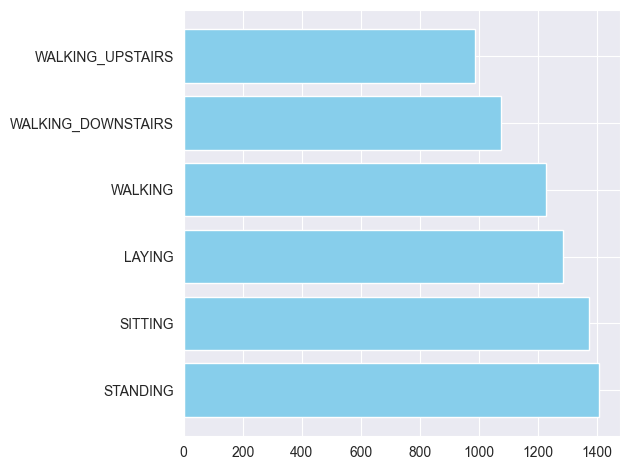

In [20]:
plt.barh(train['Activity'].unique(), train['Activity'].value_counts(), color='skyblue')
plt.tight_layout()
plt.show()

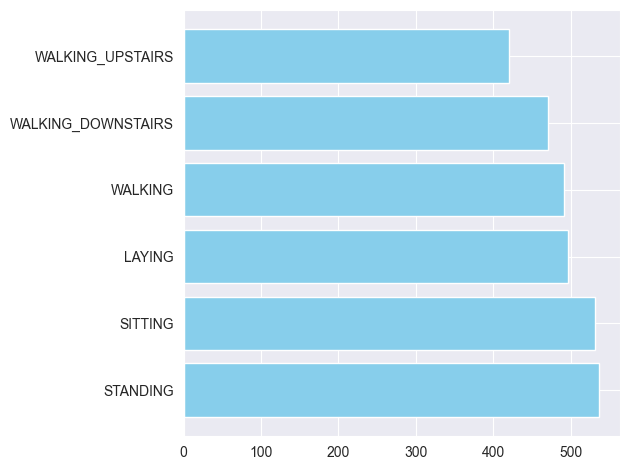

In [21]:
plt.barh(test['Activity'].unique(), test['Activity'].value_counts(), color='skyblue')
plt.tight_layout()
plt.show()

На графике виден относительный баланс категорий

### Попробуем посмотреть на корреляции, включая таргет

<Axes: >

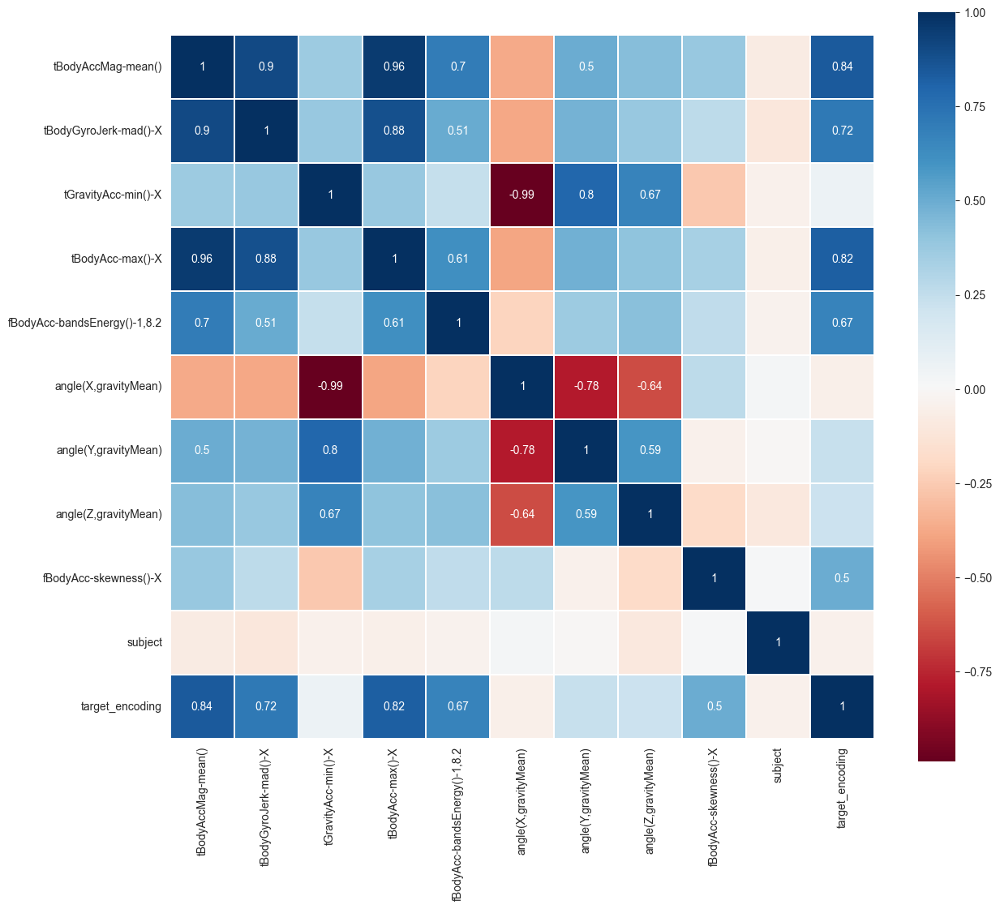

In [22]:
colormap = plt.cm.RdBu
plt.figure(figsize=(14, 12))
ax = sns.heatmap(iter_train.corr(),linewidths=0.1,
    vmax=1.0,
    square=True,
    cmap=colormap,
    linecolor="white",
    annot=True)
for t in ax.texts:
    if float(t.get_text()) >= 0.5 or float(t.get_text()) <= -0.5:
        t.set_text(t.get_text())
    else:
        t.set_text("")
ax

<Axes: >

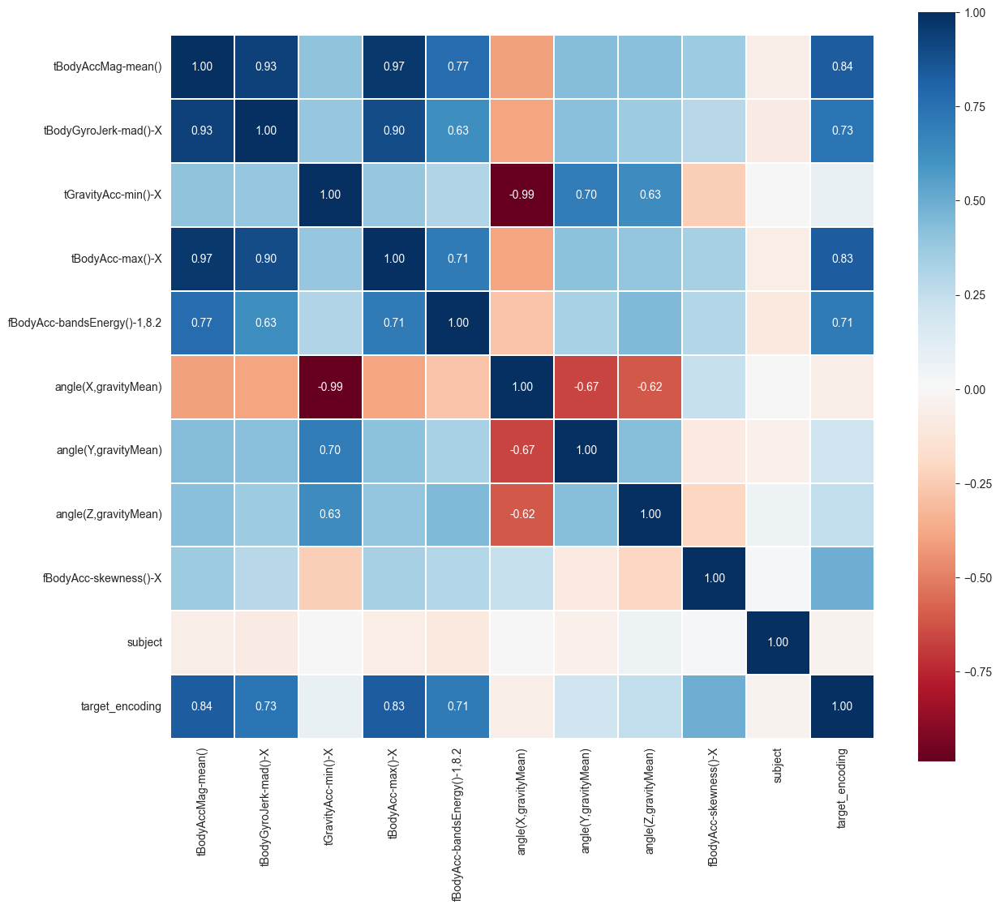

In [23]:
plt.figure(figsize=(14, 12))
bx = sns.heatmap(iter_test.corr(),linewidths=0.1,
    vmax=1.0,
    square=True,
    cmap=colormap,
    linecolor="white",
    annot=True,
    fmt='0.2f')
for t in bx.texts:
    if float(t.get_text()) >= 0.5 or float(t.get_text()) <= -0.5:
        t.set_text(t.get_text())
    else:
        t.set_text("")
bx

### Рассмотрим распределения и зависимости между признаками

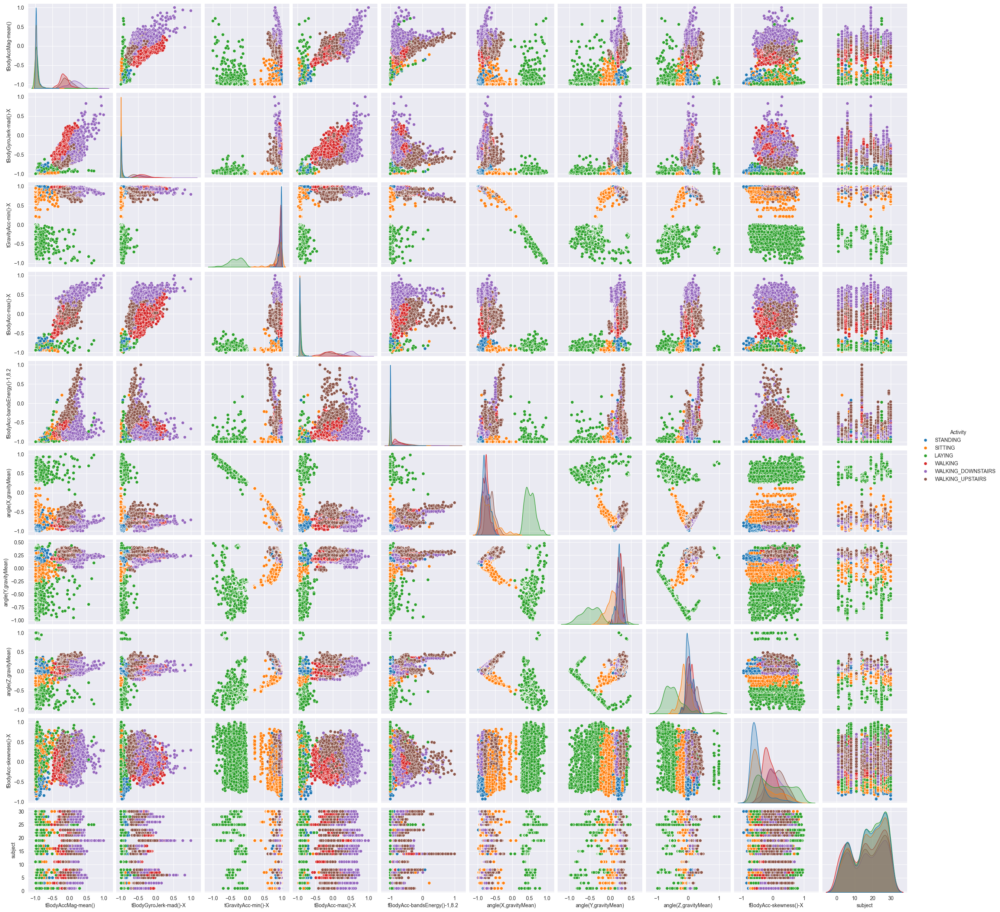

In [24]:
sns.pairplot(train, hue="Activity")

Ну можно заметить что данные распределены нормально по [x][y] = [y][x], также увидеть что на графике разных скоростей и вида activity хорошее разделение по классам. Ужасное распределние испытуемого и вида деятельности показывает что действительно рандомным давали задания , а не каждый третий сидит. 

### Попробуем проверить гипотезу , что испытуемых можно разделить по виду деятельности и посчитаем точность разделения

STANDING 100.0%
SITTING 99.0%
LAYING 97.0%
WALKING 100.0%
WALKING_DOWNSTAIRS 100.0%
WALKING_UPSTAIRS 100.0%


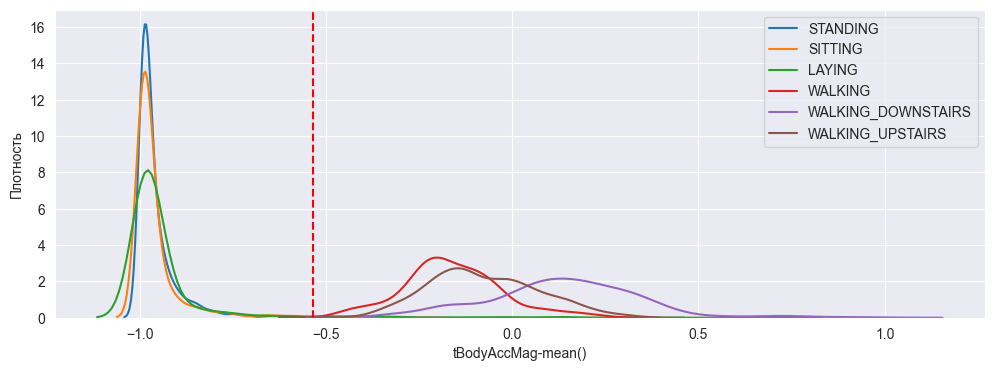

In [25]:
plt.figure(figsize=(12, 4))
activities = train['Activity'].unique()
for activity in activities:
    subset = train[train['Activity'] == activity]
    sns.kdeplot(data=subset['tBodyAccMag-mean()'], label=activity)
    
    
vertical_line = -0.535
var = 0
for activity in activities:
    count1 = 0
    count2 = 0
    subset = train[train['Activity'] == activity]
    for  index, row in subset.iterrows():
        if row['tBodyAccMag-mean()'] <= vertical_line:
            count1 += 1
        else:
            count2 += 1
    if var <= 2:
        print('{} '.format(activity) + str(round((count1) / (count1 + count2), 2) * 100) + '%')
    else:
        print('{} '.format(activity) + str(round((count2) / (count1 + count2), 2) * 100) + '%')
    var += 1

        
plt.axvline(x=vertical_line, color='red', linestyle='--')
plt.xlabel('tBodyAccMag-mean()')
plt.ylabel('Плотность')
plt.legend()
plt.show()


Вообщем-то довольно очевидно на графике что когда человек стоит сидит лежит их скорость не меняется в отличии от видов движения так что явно можно их разделить. Выбор линии произведен обычным подбором, также  получилось явно разделить динамическую группу активностей

### Попробуем найти еще закономерности на графиках

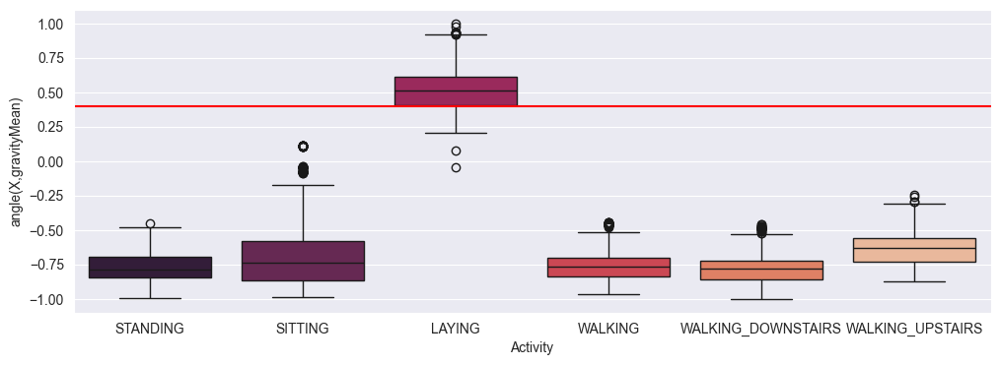

In [26]:
plt.figure(figsize=(12, 4))


sns.boxplot(x='Activity', y='angle(X,gravityMean)', data=train, palette='rocket')
laying_trigger = 0.394
plt.axhline(y = laying_trigger, color='red')

Если руководствоваться только углом angle , то согласно ему разделить на 2 вида активности получилось бы, где единственный второй вид состоял бы из laying, что и логично, тк когда он лежит он ближе к земле , а все остальное по росту можно сказать одинаковое

### Теперь посмотрим на 'tBodyAcc0max()-X' 

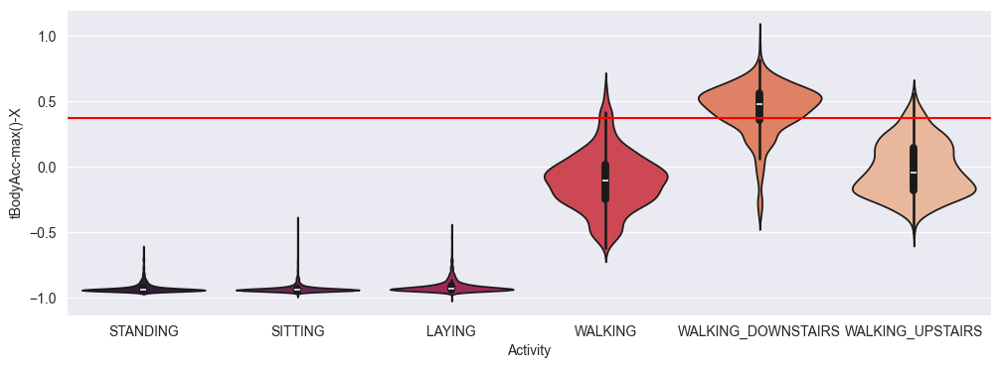

In [27]:
plt.figure(figsize=(12, 4))
sns.violinplot(x='Activity', y='tBodyAcc-max()-X', data=train, palette='rocket')
walking_downstairs_trigger = 0.375
plt.axhline(y = 0.375,color = 'red')

Я бы сказал что выделяется не конкретная активность а группа активности
Разделим группы на пассив(sitting, standing, laying) актив(walking, walking_downstairs, walking_upstairs)
Заметим , что их формы в общем виде отличаются , тк лежат сидят и стоят примерно с одной скоростью вот и плотность распределения имеет достаточно острую форму
В тот момент когда активы примерно имеют достаточно более гладкую и высокую выпуклость, так как активничают люди с разной скоростью , но тут спускаясь по леснице вниз все-таки люди набирают скорость больше нежели чем во всех остальных(молодые походу, так как если бы старики были в тех же долях как и молодые в эксперименте они бы существенно подпортили картину распределения)

### Для удобства с помощью pandas разделим искомый датасет на два под-датасета (пассивы и активы) и посмотрим как они себя ведут по отношению друг к другу

In [28]:
train['Activity'].unique()

array(['STANDING', 'SITTING', 'LAYING', 'WALKING', 'WALKING_DOWNSTAIRS',
       'WALKING_UPSTAIRS'], dtype=object)

<Axes: xlabel='Activity', ylabel='angle(Y,gravityMean)'>

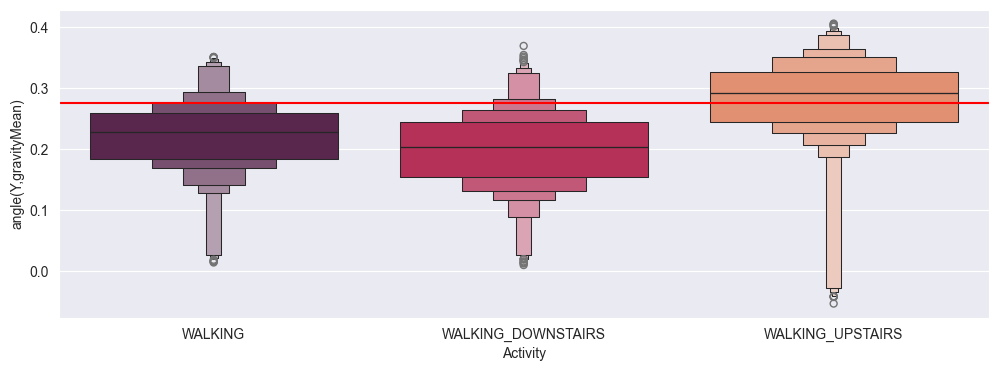

In [29]:
passive_subset = train[(train['Activity'] ==  'STANDING') | (train['Activity'] == 'LAYING') | (train['Activity'] == 'SITTING')]
dynamic_subset = train[(train['Activity'] ==  'WALKING') | (train['Activity'] == 'WALKING_DOWNSTAIRS') | (train['Activity'] == 'WALKING_UPSTAIRS')]
plt.figure(figsize=(12, 4))
walking_upstairs_trigger = 0.275
plt.axhline(y = 0.275, color='red')
sns.boxenplot(x= dynamic_subset['Activity'], y=dynamic_subset['angle(Y,gravityMean)'], data=dynamic_subset, palette='rocket')

<Axes: xlabel='Activity', ylabel='angle(Y,gravityMean)'>

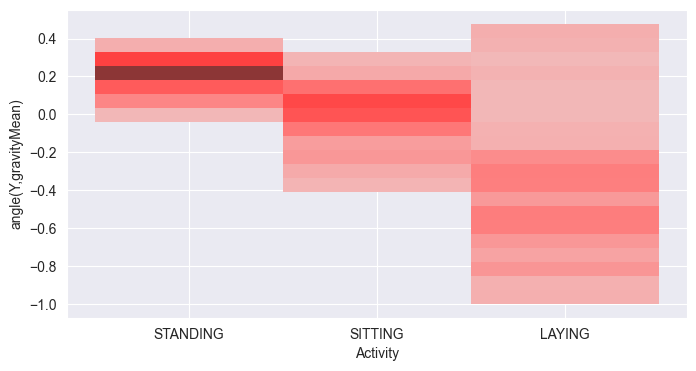

In [30]:
plt.figure(figsize=(8, 4))
sns.histplot(x= passive_subset['Activity'], y=passive_subset['angle(Y,gravityMean)'], data=passive_subset, color='red', bins=20)

На первом графике больше выделяется подъем по лестнице, что и логично тк энергия ускорения тела в интервале частоты больше при подъеме 
На втором графике больше выделяется laying, что и логично когда лежишь угол между осью Y и усредненной гравитационной составляющей ускорения покрывает большую поверхность тк кто-то может ворочался 

### Продолжаем искать признаки для недостающих активностей

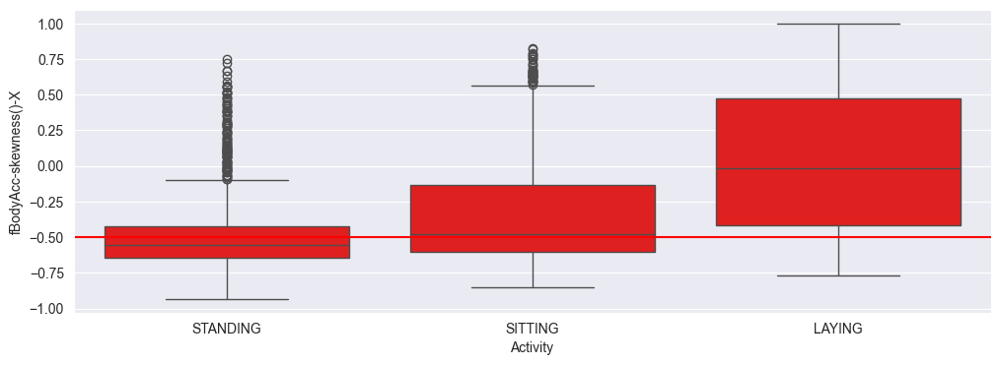

In [55]:
plt.figure(figsize=(12, 4))
sns.boxplot(x = passive_subset['Activity'], y = passive_subset['fBodyAcc-skewness()-X'], data=passive_subset, color='red')
standing_trigger = 0.15
plt.axhline(y = -0.4, color='red')

<Axes: xlabel='Activity', ylabel='fBodyAcc-skewness()-X'>

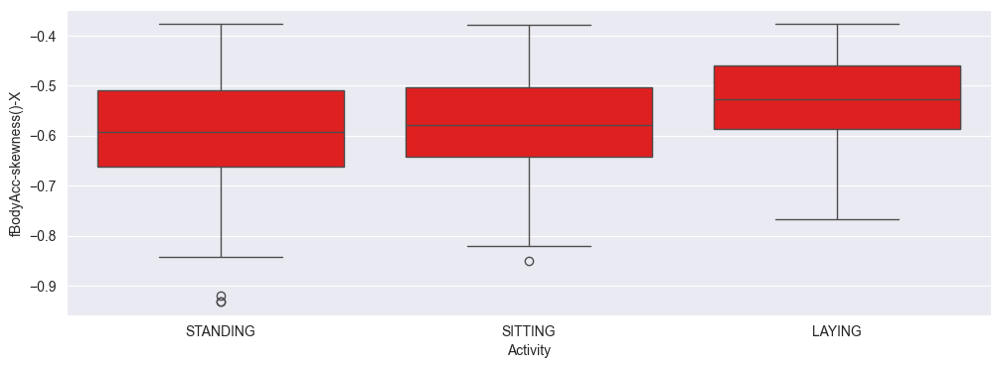

In [32]:
plt.figure(figsize=(12, 4))
new_df = passive_subset[passive_subset['fBodyAcc-skewness()-X'] < -0.376]
sns.boxplot(x = new_df['Activity'], y = new_df['fBodyAcc-skewness()-X'], data=new_df, color='red')


### Попробуем выделить последнюю активность


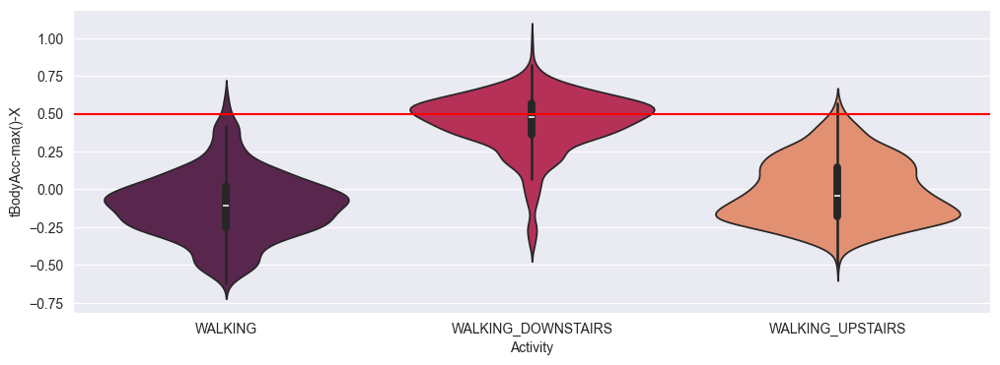

In [53]:
# (✖╭╮✖) your code here
plt.figure(figsize=(12, 4))
sns.violinplot(x='Activity', y='tBodyAcc-max()-X', data=dynamic_subset, palette='rocket')
plt.axhline(y = 0.5, color='red')

<Axes: xlabel='tGravityAcc-min()-X', ylabel='Activity'>

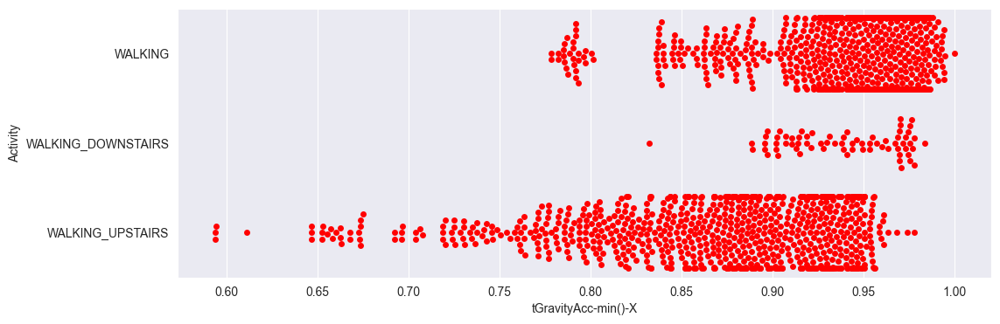

In [34]:
plt.figure(figsize=(12, 4))

subset2 = dynamic_subset[dynamic_subset['tBodyAcc-max()-X'] < 0.157]
sns.swarmplot(x='tGravityAcc-min()-X', y='Activity', data=subset2, color='red')

In [35]:
min1 = 100000
min2 = 100000
max3 = 0
glob_max = 0
vert = 0
activities = dynamic_subset['Activity'].unique()
for vertical_line2 in range(1000):
    vertical_line2 /= 1000
    count1 = 0
    count2 = 0
    count3 = 0
    for i in range(len(activities)):
        activity = activities[i] 
        subset = dynamic_subset[dynamic_subset['Activity'] == activity]
        for index, row in subset.iterrows():
            if i == 0 and row['tGravityAcc-min()-X'] < vertical_line2:
                count1 += 1
            elif i == 1 and row['tGravityAcc-min()-X'] < vertical_line2:
                count2 += 1
            elif i == 2 and row['tGravityAcc-min()-X'] < vertical_line2:
                count3 += 1
    if count1 < min1 and count2 < min2 and count3 > max3:
        min1 = count1
        min2 = count2
        max3 = count3
        glob_max = (count3 / (count1 + count2 + count3)) * 100
        vert = vertical_line2
print(vert, glob_max)
    


0.594 100.0


<Axes: xlabel='tGravityAcc-min()-X', ylabel='Activity'>

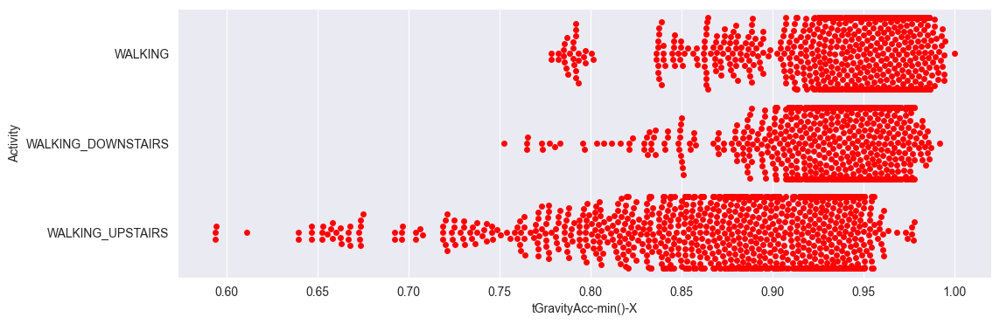

In [36]:
plt.figure(figsize=(12, 4))

subset3 = dynamic_subset[dynamic_subset['tBodyAcc-max()-X'] < vert]
sns.swarmplot(x='tGravityAcc-min()-X', y='Activity', data=subset3, color='red')

### Лирическое отступление и демонстрация графиков через plotly.

In [37]:
%%time
from sklearn.manifold import TSNE
tsne = TSNE(random_state=666, n_components=2)
new = tsne.fit_transform(train.drop(['subject', 'Activity'], axis=1))
df_2_comp = pd.concat([
    pd.DataFrame(new, columns=['x', 'y']),
    train['Activity']
], axis=1)

tsne = TSNE(random_state=666, n_components=3)
new = tsne.fit_transform(train.drop(['subject', 'Activity'], axis=1))
df_3_comp = pd.concat([
    pd.DataFrame(new, columns=['x', 'y', 'z']),
    train['Activity']
], axis=1)

CPU times: total: 28.8 s
Wall time: 37.6 s


In [38]:
import plotly.express as px

fig = px.scatter(df_2_comp, x='x', y='y', color='Activity', title=' 2D ')

fig.show()

In [39]:
fig = px.scatter_3d(df_3_comp, x='x', y='y', z='z', color='Activity', title='3D ')

fig.show()

### А теперь проверим насколько хорошо мы выводили и попробуем построить простенькое дерево решений глубины 2 

In [134]:
def predict(df: pd.DataFrame):
    dd = df.copy()
    #первый блок проверок того к какому типу относим активность
    for index, row in dd.iterrows():
        if row['tBodyAccMag-mean()'] <= -0.535:
            if row['angle(Y,gravityMean)'] <= -0.3  or row['angle(X,gravityMean)'] >= 0.22:
                dd.at[index, 'Activity'] = 'LAYING'
            elif row['angle(Y,gravityMean)'] >= 0.17:
                dd.at[index, 'Activity'] = 'STANDING'
            elif (row['angle(Y,gravityMean)']<= 0.1 and row['angle(Y,gravityMean)'] >= -0.1) or row['tGravityAcc-min()-X'] <= -0.175:
                dd.at[index, 'Activity'] = 'SITTING'
        else:
            if row['tBodyAcc-max()-X'] > 0.5 or row['tBodyAccMag-mean()'] >= 0.25:
                dd.at[index, 'Activity']= 'WALKING_DOWNSTAIRS'
            elif row['angle(Y,gravityMean)']  >= 0.260 or row['tGravityAcc-min()-X'] <= 0.91 or row['tBodyGyroJerk-mad()-X']  <= -0.53:
                dd.at[index, 'Activity'] = 'WALKING_UPSTAIRS'
            else:
                dd.at[index, 'Activity'] = 'WALKING'
    return dd['Activity']

def accuracy_score(y_true, y_pred) -> float:
    y_true = np.asarray(y_true).reshape(-1, 1)
    y_pred = np.asarray(y_pred).reshape(-1, 1)
    return (y_true == y_pred).mean()

In [135]:

train_preds = predict(train)
test_preds = predict(test)
print(f"Accuracy on train set => {accuracy_score(train['Activity'], train_preds)}")
print(f"Accuracy on test set => {accuracy_score(test['Activity'], test_preds)}")

Accuracy on train set => 0.8101196953210011
Accuracy on test set => 0.7526297930098406


UPD: Все подборы для дерева решений выполнялись на трейне